In [1]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
from scipy import misc
import cv2
import csv
import pickle
import os

In [2]:
from keras import backend as K
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Convolution1D, MaxPooling1D
from keras.utils import np_utils
from keras.layers.convolutional import Conv1D, Conv2D
from keras.layers import GRU, LSTM
from keras.layers.convolutional import MaxPooling1D
from keras.layers.embeddings import Embedding
from keras.layers.convolutional_recurrent import ConvLSTM2D
from keras.layers.normalization import BatchNormalization
from keras.preprocessing import sequence
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences

/usr/local/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


# Utils functions

In [3]:
def get_data_and_target_path(data_file, target_file):
    with open(data_file, "r") as dataF:
        reader = csv.reader(dataF)
        data_paths = [row for row in reader]
    with open(target_file, "r") as targetF:
        reader = csv.reader(targetF)
        target_paths = [row[0] for row in reader]
    return data_paths, target_paths


def get_im(path, reduceSize=None):
    # reduceSize can be a tuple, example: (128, 96)
    img = misc.imread(path)
    # Reduce size
    if reduceSize is not None:
        img = misc.imresize(img, reduceSize)
    return img


def load_data_target(data_file, target_file, reduceSize=None):
    data_paths, target_paths = get_data_and_target_path(data_file, target_file)
    X_ = []
    y_ = []
    for data_path_list in data_paths:
        currentX_ = []
        for fl in data_path_list:
            img = get_im(fl, reduceSize)
            currentX_.append(img)
        X_.append(currentX_)
    
    for target_path in target_paths:
        img = get_im(target_path, reduceSize)
        y_.append(img)
        
    return X_, y_


# Data
def cache_data(data, path):
    if os.path.isdir(os.path.dirname(path)):
        file = open(path, 'wb')
        pickle.dump(data, file)
        file.close()
    else:
        print('Directory doesnt exists')


def restore_data(path):
    data = dict()
    if os.path.isfile(path):
        file = open(path, 'rb')
        data = pickle.load(file)
        file.close()
    return data


# Model
def save_model(model):
    json_string = model.to_json()
    if not os.path.isdir('cache'):
        os.mkdir('cache')
    open(os.path.join('cache', 'architecture.json'), 'w').write(json_string)
    model.save_weights(os.path.join('cache', 'model_weights.h5'), overwrite=True)


def load_model():
    model = model_from_json(open(os.path.join('cache', 'architecture.json')).read())
    model.load_weights(os.path.join('cache', 'model_weights.h5'))
    return model

# Get train, validation and test data

In [4]:
def get_data(data_type='train', reduceSize=None):
    if not os.path.isdir('cache'):
        os.mkdir('cache')
    cache_path = os.path.join('cache', '{}.dat'.format(data_type))
    if not os.path.isfile(cache_path):
        print('Read {} images.'.format(data_type))
        data, target = load_data_target('{}_data.csv'.format(data_type), 
                                        '{}_target.csv'.format(data_type),
                                        reduceSize=reduceSize)
        data = np.array(data, dtype=np.float32)
        data = np.expand_dims(data, axis=-1)
        target = np.array(target, dtype=np.float32)
        target = np.expand_dims(target, axis=-1)
        cache_data((data, target), cache_path)
    else:
        print('Restore {} from cache!'.format(data_type))
        (data, target) = restore_data(cache_path)
    return (data, target)

In [5]:
#reduceSize = None
reduceSize = (40,40)
(train_data, train_target) = get_data(data_type='train', reduceSize=reduceSize)
(val_data, val_target) = get_data(data_type='val', reduceSize=reduceSize)
(test_data, test_target) = get_data(data_type='test', reduceSize=reduceSize)

Restore train from cache!
Restore val from cache!
Restore test from cache!


In [6]:
timesteps = len(train_data[0])
img_size = train_data[0][0].shape
img_rows, img_cols = img_size[0], img_size[1]
print(timesteps, img_rows, img_cols)

7 40 40


In [7]:
print('train_data shape: ', train_data.shape)
print('train_target shape: ', train_target.shape)
print('val_data shape: ', val_data.shape)
print('val_target shape: ', val_target.shape)
print('test_data shape: ', test_data.shape)
print('test_target shape: ', test_target.shape)

train_data shape:  (144, 7, 40, 40, 1)
train_target shape:  (144, 40, 40, 1)
val_data shape:  (64, 7, 40, 40, 1)
val_target shape:  (64, 40, 40, 1)
test_data shape:  (64, 7, 40, 40, 1)
test_target shape:  (64, 40, 40, 1)


In [8]:
def scaleAsTrain(data, scaler):
    if (data.ndim == 5):
        x = data.reshape(data.shape[0]*data.shape[1]*data.shape[2], data.shape[3]*data.shape[4])
    else:
        x = data.reshape(data.shape[0]*data.shape[1], data.shape[2]*data.shape[3])
    scale_x = scaler.transform(x)
    return scale_x.reshape(data.shape)

In [9]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaler.fit(train_data.reshape(train_data.shape[0]*train_data.shape[1]*train_data.shape[2], 
                              train_data.shape[3]*train_data.shape[4]))

train_data = scaleAsTrain(train_data, scaler)
train_target = scaleAsTrain(train_target, scaler)
val_data = scaleAsTrain(val_data, scaler)
val_target = scaleAsTrain(val_target, scaler)
test_data = scaleAsTrain(test_data, scaler)
test_target = scaleAsTrain(test_target, scaler)

# Keras ConvLSTM Model

In [10]:
from keras import losses

seq = Sequential()
seq.add(ConvLSTM2D(filters=40, kernel_size=(3, 3),
                   input_shape=(None, img_rows, img_cols, 1),
                   padding='same', return_sequences=True))
seq.add(BatchNormalization())

seq.add(ConvLSTM2D(filters=40, kernel_size=(3, 3),
                   padding='same', return_sequences=True))
seq.add(BatchNormalization())

seq.add(ConvLSTM2D(filters=40, kernel_size=(3, 3),
                   padding='same', return_sequences=True))
seq.add(BatchNormalization())

seq.add(ConvLSTM2D(filters=40, kernel_size=(3, 3),
                   padding='same', return_sequences=False))
seq.add(BatchNormalization())

seq.add(Conv2D(filters=1, kernel_size=(3, 3),
               activation='sigmoid',
               padding='same', data_format='channels_last'))

seq.compile(optimizer = "sgd", loss = losses.mean_squared_error, 
              metrics =["mse"])

In [11]:
history = seq.fit(train_data, train_target, batch_size=10,
                  epochs=100, validation_data=(val_data, val_target))

Train on 144 samples, validate on 64 samples
Epoch 1/100
144/144 [==============================] - 17s 119ms/step - loss: 0.0493 - mean_squared_error: 0.0493 - val_loss: 0.0347 - val_mean_squared_error: 0.0347
Epoch 2/100
144/144 [==============================] - 13s 93ms/step - loss: 0.0338 - mean_squared_error: 0.0338 - val_loss: 0.0311 - val_mean_squared_error: 0.0311
Epoch 3/100
144/144 [==============================] - 13s 93ms/step - loss: 0.0290 - mean_squared_error: 0.0290 - val_loss: 0.0315 - val_mean_squared_error: 0.0315
Epoch 4/100
144/144 [==============================] - 13s 93ms/step - loss: 0.0261 - mean_squared_error: 0.0261 - val_loss: 0.0272 - val_mean_squared_error: 0.0272
Epoch 5/100
144/144 [==============================] - 13s 93ms/step - loss: 0.0244 - mean_squared_error: 0.0244 - val_loss: 0.0285 - val_mean_squared_error: 0.0285
Epoch 6/100
144/144 [==============================] - 13s 93ms/step - loss: 0.0228 - mean_squared_error: 0.0228 - val_loss: 0.02

144/144 [==============================] - 13s 93ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0158 - val_mean_squared_error: 0.0158
Epoch 51/100
144/144 [==============================] - 13s 93ms/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0153 - val_mean_squared_error: 0.0153
Epoch 52/100
144/144 [==============================] - 13s 93ms/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0153 - val_mean_squared_error: 0.0153
Epoch 53/100
144/144 [==============================] - 13s 93ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0170 - val_mean_squared_error: 0.0170
Epoch 54/100
144/144 [==============================] - 14s 94ms/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0149 - val_mean_squared_error: 0.0149
Epoch 55/100
144/144 [==============================] - 13s 93ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0154 - val_mean_squared_error: 0.0154
Epoch 56/100
144/

144/144 [==============================] - 14s 96ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0134 - val_mean_squared_error: 0.0134
Epoch 100/100
144/144 [==============================] - 14s 94ms/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0131 - val_mean_squared_error: 0.0131


In [ ]:
plt.plot(history['mse'])

In [48]:
def predictAndVisualize(which, data, target):
    import matplotlib.gridspec as gridspec
    plt.figure(figsize=(10, 10))
    G = gridspec.GridSpec(2, 7)
    
    example = data[which, :, :, :,0]
    for i, img in enumerate(example):
        axe = plt.subplot(G[0, i])
        axe.imshow(img)

    target_example = target[which, :, :, 0]
    pred = seq.predict(data[which][np.newaxis, :, :, :, :])
    
    ax_groundtruth = plt.subplot(G[1, :3])
    ax_groundtruth.imshow(target_example)
    ax_groundtruth.set_title('groundtruth')
    
    ax_pred = plt.subplot(G[1, 3:6])
    ax_pred.imshow(pred[0, :, :, 0])
    ax_pred.set_title('predict')

    eval = seq.evaluate(np.expand_dims(data[which], axis=0), np.expand_dims(target[which], axis=0))
    print(eval)

1/1 [==============================] - 0s 34ms/step
[0.008159716613590717, 0.008159716613590717]


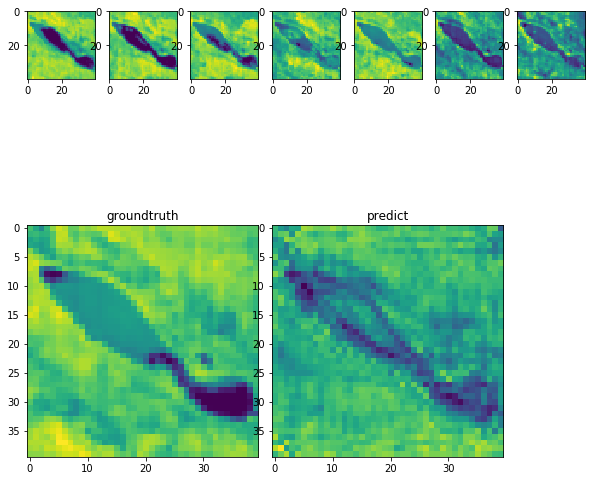

In [51]:
which = 50
data = test_data
target = test_target
predictAndVisualize(which, data, target)

1/1 [==============================] - 0s 34ms/step
[0.006133067421615124, 0.006133067421615124]
1/1 [==============================] - 0s 33ms/step
[0.005873039364814758, 0.005873039364814758]
1/1 [==============================] - 0s 34ms/step
[0.00628376379609108, 0.00628376379609108]
1/1 [==============================] - 0s 34ms/step
[0.006454722955822945, 0.006454722955822945]
1/1 [==============================] - 0s 34ms/step
[0.006877668667584658, 0.006877668667584658]
1/1 [==============================] - 0s 34ms/step
[0.008233641274273396, 0.008233641274273396]
1/1 [==============================] - 0s 34ms/step
[0.007282261736690998, 0.007282261736690998]
1/1 [==============================] - 0s 51ms/step
[0.010216810740530491, 0.010216810740530491]
1/1 [==============================] - 0s 34ms/step
[0.006693738512694836, 0.006693738512694836]
1/1 [==============================] - 0s 34ms/step
[0.024929534643888474, 0.024929534643888474]
1/1 [===========================

/usr/local/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


1/1 [==============================] - 0s 33ms/step
[0.010199284180998802, 0.010199284180998802]
1/1 [==============================] - 0s 48ms/step
[0.005563197657465935, 0.005563197657465935]
1/1 [==============================] - 0s 34ms/step
[0.01114633772522211, 0.01114633772522211]
1/1 [==============================] - 0s 34ms/step
[0.008597658015787601, 0.008597658015787601]
1/1 [==============================] - 0s 37ms/step
[0.028349976986646652, 0.028349976986646652]
1/1 [==============================] - 0s 34ms/step
[0.012501397170126438, 0.012501397170126438]
1/1 [==============================] - 0s 34ms/step
[0.013382736593484879, 0.013382736593484879]
1/1 [==============================] - 0s 34ms/step
[0.006725089158862829, 0.006725089158862829]
1/1 [==============================] - 0s 33ms/step
[0.012904598377645016, 0.012904598377645016]
1/1 [==============================] - 0s 34ms/step
[0.0044657522812485695, 0.0044657522812485695]
1/1 [=========================

1/1 [==============================] - 0s 32ms/step
[0.024555839598178864, 0.024555839598178864]
1/1 [==============================] - 0s 31ms/step
[0.005060010589659214, 0.005060010589659214]
1/1 [==============================] - 0s 32ms/step
[0.01184272300451994, 0.01184272300451994]
1/1 [==============================] - 0s 32ms/step
[0.008488654159009457, 0.008488654159009457]
1/1 [==============================] - 0s 32ms/step
[0.017472848296165466, 0.017472848296165466]
1/1 [==============================] - 0s 32ms/step
[0.005265828222036362, 0.005265828222036362]
1/1 [==============================] - 0s 32ms/step
[0.009056628681719303, 0.009056628681719303]
1/1 [==============================] - 0s 32ms/step
[0.008479958400130272, 0.008479958400130272]
1/1 [==============================] - 0s 32ms/step
[0.005335543304681778, 0.005335543304681778]
1/1 [==============================] - 0s 32ms/step
[0.006749504711478949, 0.006749504711478949]
1/1 [===========================

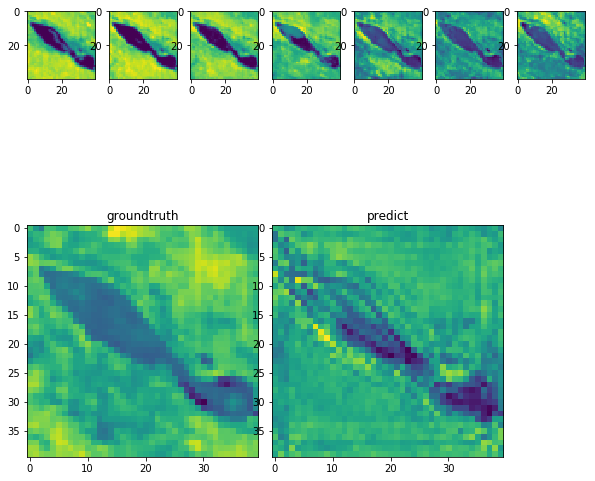

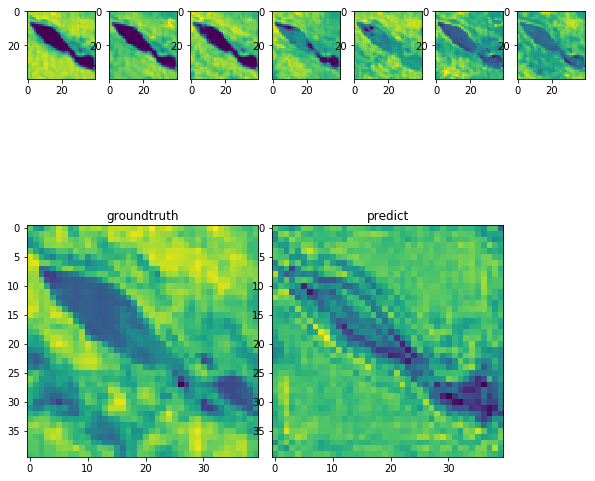

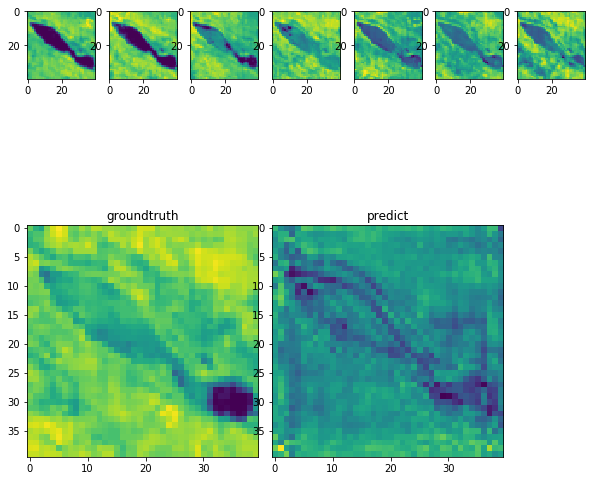

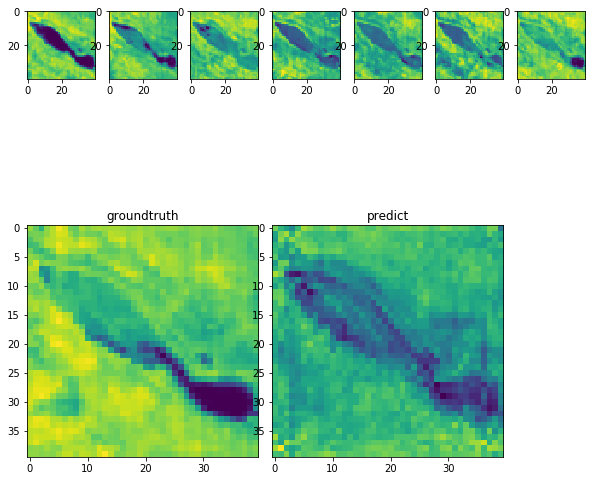

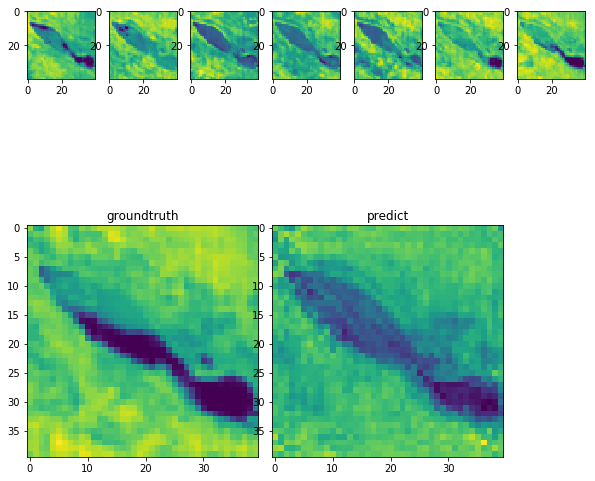

...

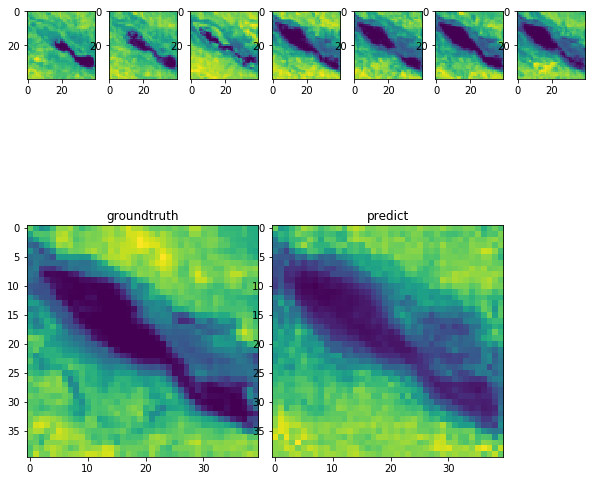

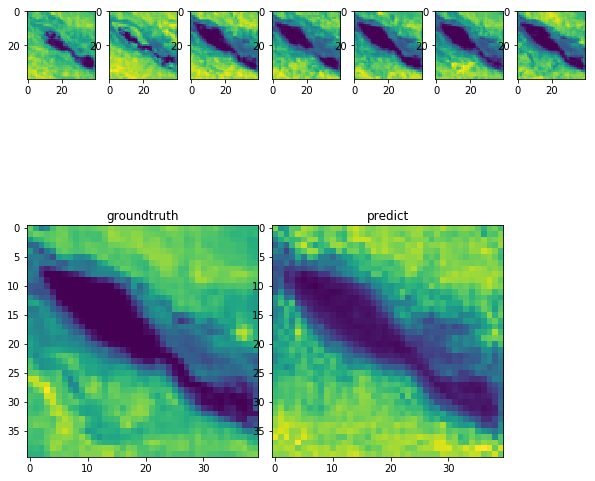

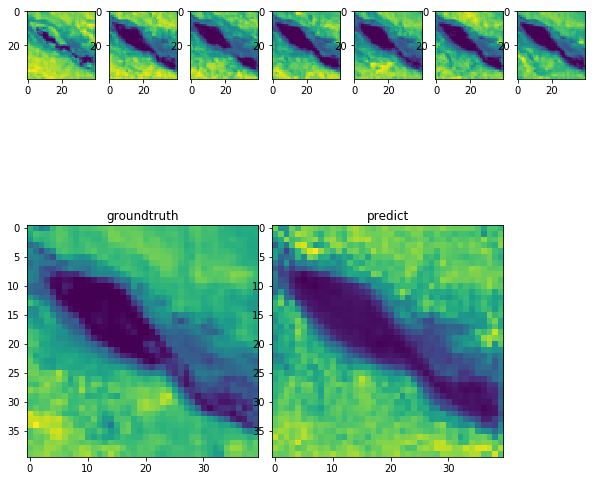

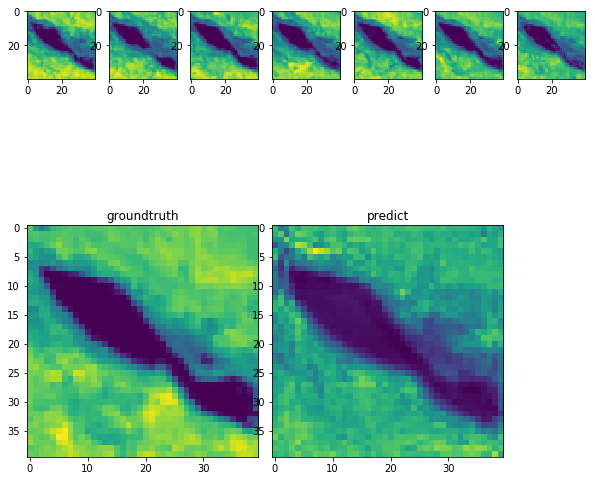

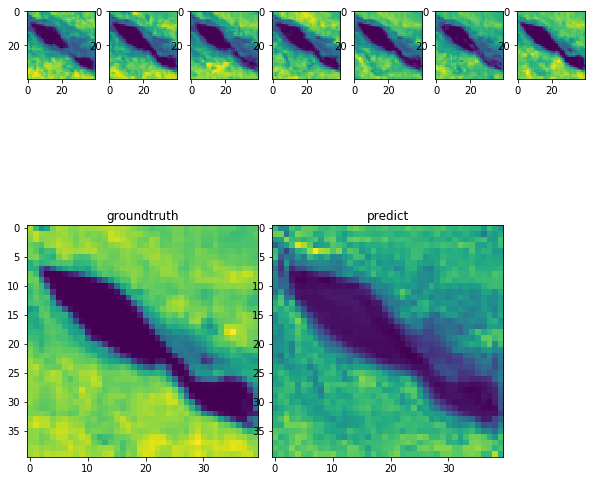

In [52]:
for i in range(144):
    predictAndVisualize(i, train_data, train_target)

1/1 [==============================] - 0s 33ms/step
[0.005631530191749334, 0.005631530191749334]
1/1 [==============================] - 0s 34ms/step
[0.004531817510724068, 0.004531817510724068]
1/1 [==============================] - 0s 33ms/step
[0.0069504063576459885, 0.0069504063576459885]
1/1 [==============================] - 0s 34ms/step
[0.003866596147418022, 0.003866596147418022]
1/1 [==============================] - 0s 34ms/step
[0.004873390309512615, 0.004873390309512615]
1/1 [==============================] - 0s 34ms/step
[0.010805224068462849, 0.010805224068462849]
1/1 [==============================] - 0s 34ms/step
[0.0073165930807590485, 0.0073165930807590485]
1/1 [==============================] - 0s 41ms/step
[0.012813610956072807, 0.012813610956072807]
1/1 [==============================] - 0s 46ms/step
[0.03182099387049675, 0.03182099387049675]
1/1 [==============================] - 0s 33ms/step
[0.01793654076755047, 0.01793654076755047]
1/1 [=========================

/usr/local/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


1/1 [==============================] - 0s 56ms/step
[0.008895638398826122, 0.008895638398826122]
1/1 [==============================] - 0s 31ms/step
[0.007167225703597069, 0.007167225703597069]
1/1 [==============================] - 0s 32ms/step
[0.0059908293187618256, 0.0059908293187618256]
1/1 [==============================] - 0s 32ms/step
[0.007767773699015379, 0.007767773699015379]
1/1 [==============================] - 0s 32ms/step
[0.006601883098483086, 0.006601883098483086]
1/1 [==============================] - 0s 31ms/step
[0.013791368342936039, 0.013791368342936039]
1/1 [==============================] - 0s 33ms/step
[0.008722796104848385, 0.008722796104848385]
1/1 [==============================] - 0s 32ms/step
[0.006556467618793249, 0.006556467618793249]
1/1 [==============================] - 0s 32ms/step
[0.007932904176414013, 0.007932904176414013]
1/1 [==============================] - 0s 31ms/step
[0.006648578681051731, 0.006648578681051731]
1/1 [=======================

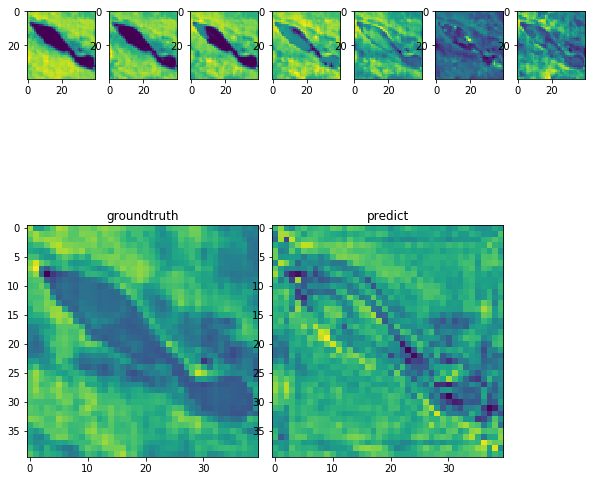

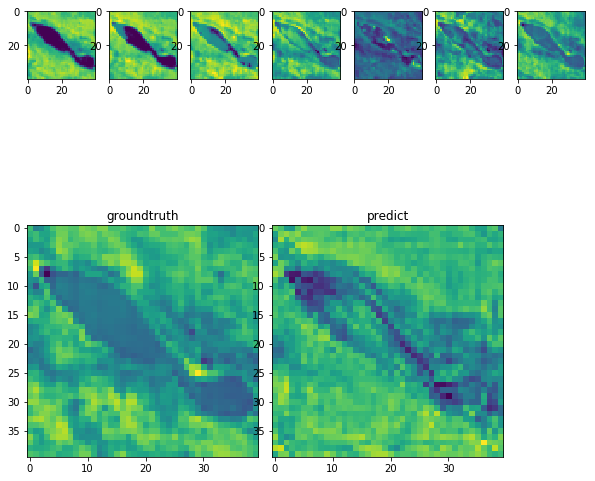

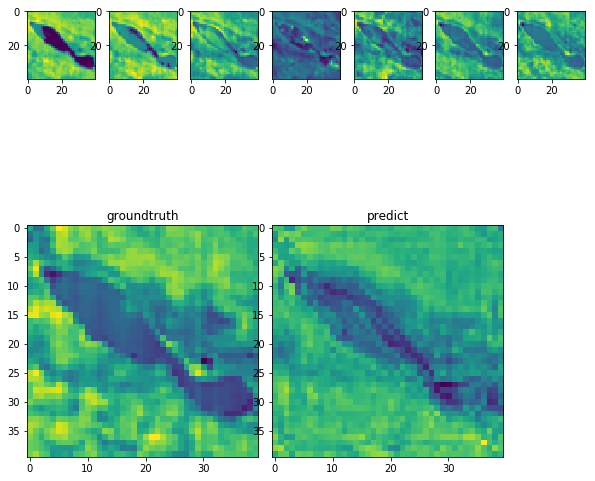

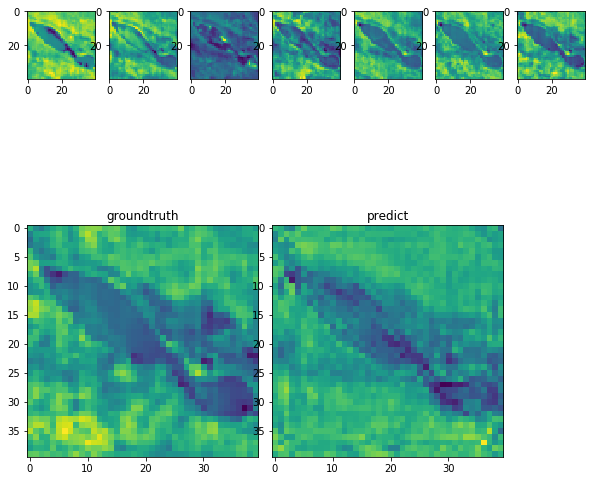

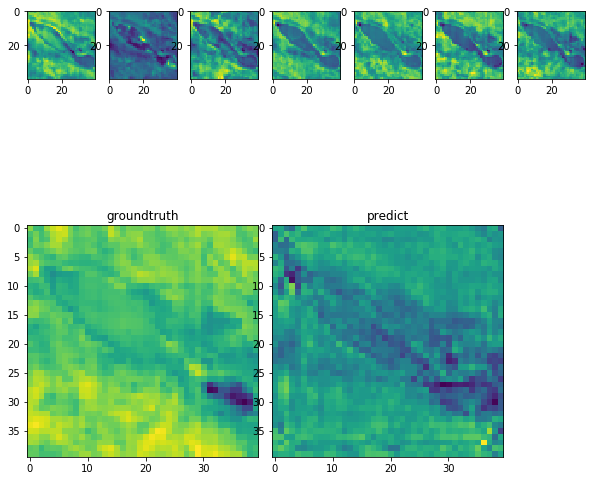

...

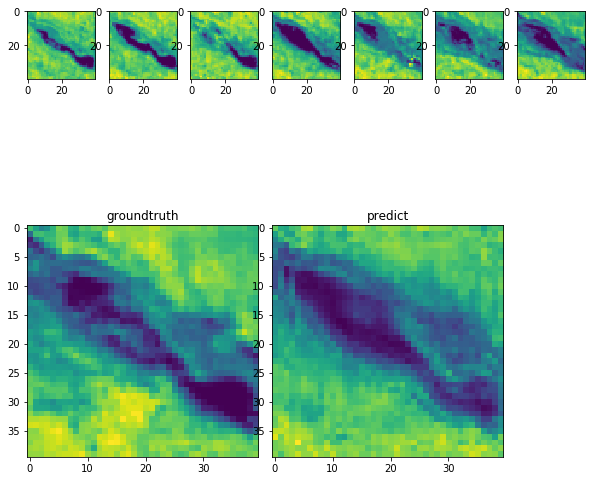

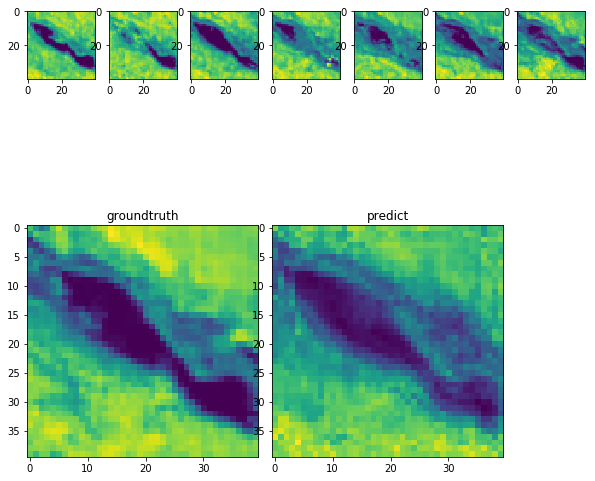

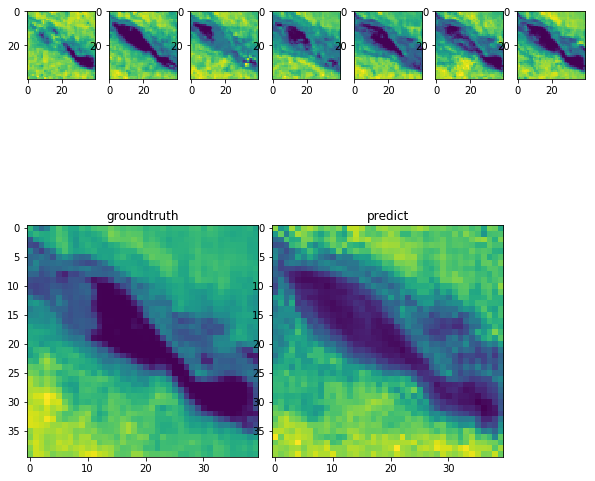

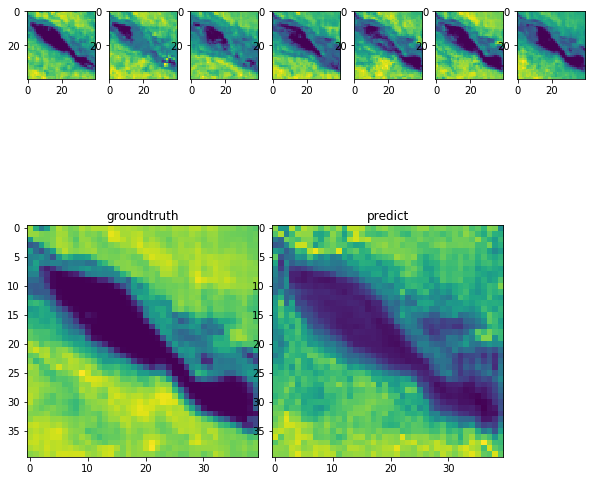

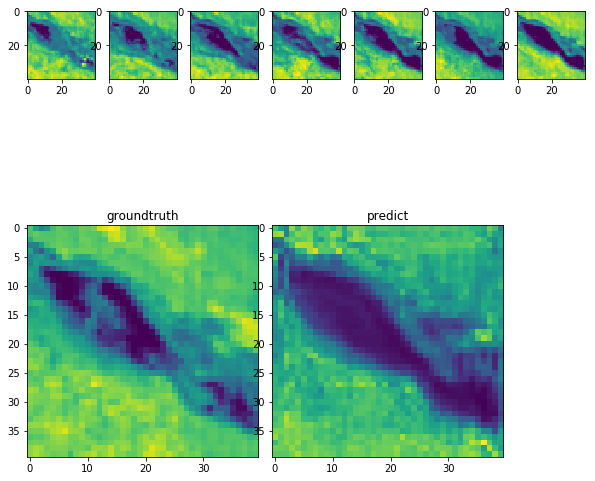

In [53]:
for i in range(test_data.shape[0]):
    predictAndVisualize(i, test_data, test_target)